### Final Project - BIOS 470
### Shrutika Gupta

## Introduction

Introduction: What is the current state of the field that the paper addresses and what is the problem that the paper aims to solve? What data was collected to do this and what are the main claims of the paper?

"Early life adversity shapes social subordination and cell type–specific transcriptomic patterning in the ventral hippocampus"

**Brief Summary of Paper**

This paper addresses the idea that adversity experienced in early life can result in changes in one's neurodevelopment. Specifically, it utilizes single-cell RNA sequencing techniques to investigate molecular-level changes in brain cell types. 

**Current State of the Field**

Currently, evidence exists that demonstrate the causal affects of adversity in early life on the development of neurological disorders (including mental health conditions). The theorized rationale is that adverse experiences can result in increased levels of corticosteroids; as certain brain regions have a significant presence of stress hormone receptors, they are thus at a more vulnerable state. The resultant effects are changes in maturation, development, and gene expression of cells in these regions.

**Aim of Paper and Collected Data**

The paper aims to solve the question of what the fundamental molecular mechanisms behind early life adversity (referred to as ELA) are, and how specifically does ELA affect different cell types. In order to do this, the researchers collected and analyzed a variety of data. First, they tracked mice to determine patterns of ELA exposure on behavior in social settings. Through statistics and modeling, they confirmed that exposure to ELA can result in social subordination. The main part of the study was the subsequent experiments and analysis, where they then exposed ELA mice to a stressor known as acute social defeat stress (which is a stressor based on social positions). From this experiment, they collected data on cells in the ventral HPC region of the brain, performed single cell RNA sequence analysis on the cell types present, and drew conclusions. I focused on the scRNA sequence analysis part of the study.

**Reproducing Claims of the Paper**

The paper utilizes three mice from four separate conditions (baseline control, baseline stress, ELA-exposed control, ELA-exposed stress) and exposes them to stressors. The five analyses that I replicated: The first analysis is to process and identify the distinct cell clusters and to evaluate based on cell identity (Figure 2D). The second claim looks at expression patterns of specific genes that are each present in certain cells (the aim of this is to extrapolate and analyze expression levels of cells, to confirm cell identity) (Supplemental Figure 4A). The third claim looks at cell clusters localized in hippocampal regions, finding nine such clusters (Supplemental Figures 4B and 4C). The fourth claim, in Supplemental Figure 5B and 5C, is that no significant changes were found in the composition of cell types per sample. Finally, the fifth claim, in Supplemental Figure 6a, is that no changes were found in proportions of cell types in samples. I will be reproducing these above figures in this analysis.

Paper results and reproductions for each claim are presented first (as images), followed by code to produce reproduction.

## Results

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import scipy as sp
import anndata as ann

import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors

import warnings
warnings.filterwarnings("ignore")

## Claim 1 Comparison ##

### UMAP Figure from Paper ###
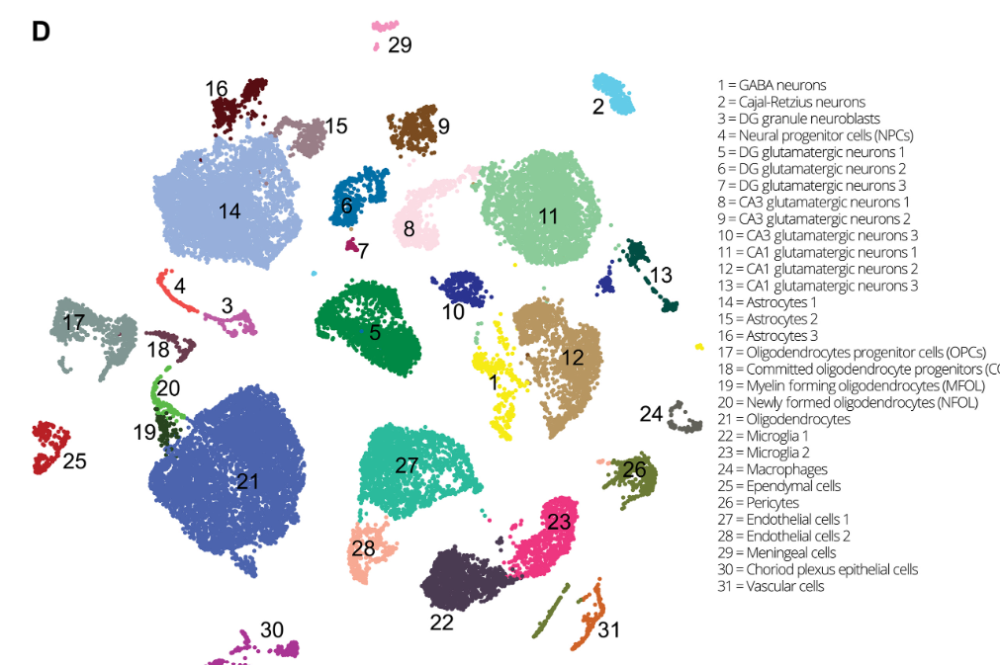

### UMAP Figure Reproduction ###
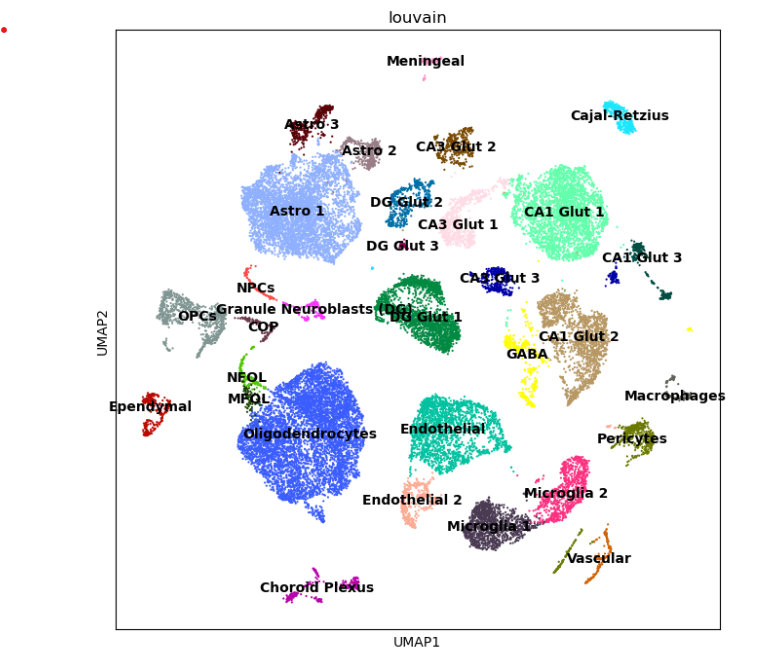

The code for Claim 1 is shown below.

In [3]:
adata = sc.read('adata_els.h5ad')
print(adata)

adata.raw = adata

AnnData object with n_obs × n_vars = 28167 × 4000
    obs: 'G2M_score', 'S_score', 'adult_stress', 'baseline', 'batch', 'condition', 'log_counts', 'louvain', 'louvain_high_res', 'mt_fraction', 'n_counts', 'n_genes', 'phase', 'sample_id', 'sample_name', 'size_factors', 'umap_density_adult_stress'
    uns: 'emb', 'louvain', 'louvain_OPC', 'neighbors', 'pca', 'rank_genes_10_sub', 'rank_genes_11_sub', 'rank_genes_13_sub', 'rank_genes_15_sub', 'rank_genes_19_sub', 'rank_genes_20_sub', 'rank_genes_23_sub', 'rank_genes_24_sub', 'rank_genes_28_sub', 'rank_genes_2_sub', 'rank_genes_Astro 1_sub', 'rank_genes_Astro 2_sub', 'rank_genes_Astro 3_sub', 'rank_genes_CCK_sub', 'rank_genes_COP_sub', 'rank_genes_Endothelial 2_sub', 'rank_genes_Endothelial_sub', 'rank_genes_GABA_sub', 'rank_genes_Glut 1_sub', 'rank_genes_Glut 2_sub', 'rank_genes_Glut 3_sub', 'rank_genes_Glut 4_sub', 'rank_genes_Macrophages_sub', 'rank_genes_Microglia 1_sub', 'rank_genes_Microglia 2_sub', 'rank_genes_NPCs_sub', 'rank_genes_

In [5]:
adata.X

<28167x4000 sparse matrix of type '<class 'numpy.float32'>'
	with 112668000 stored elements in Compressed Sparse Row format>

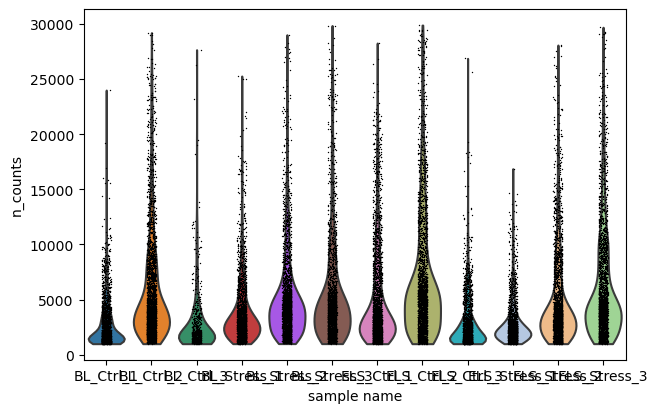

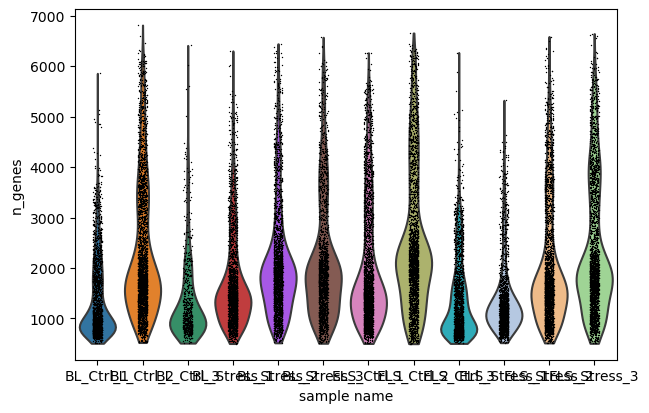

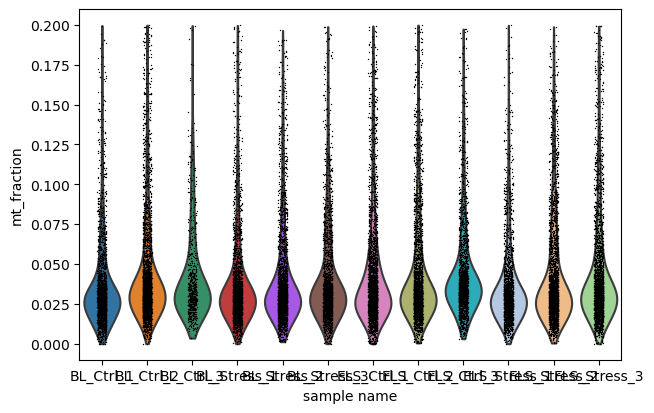

In [6]:
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

sc.pl.violin(adata,['n_counts'], groupby='sample_name')
sc.pl.violin(adata,['n_genes'], groupby='sample_name')
sc.pl.violin(adata,['mt_fraction'], groupby='sample_name')

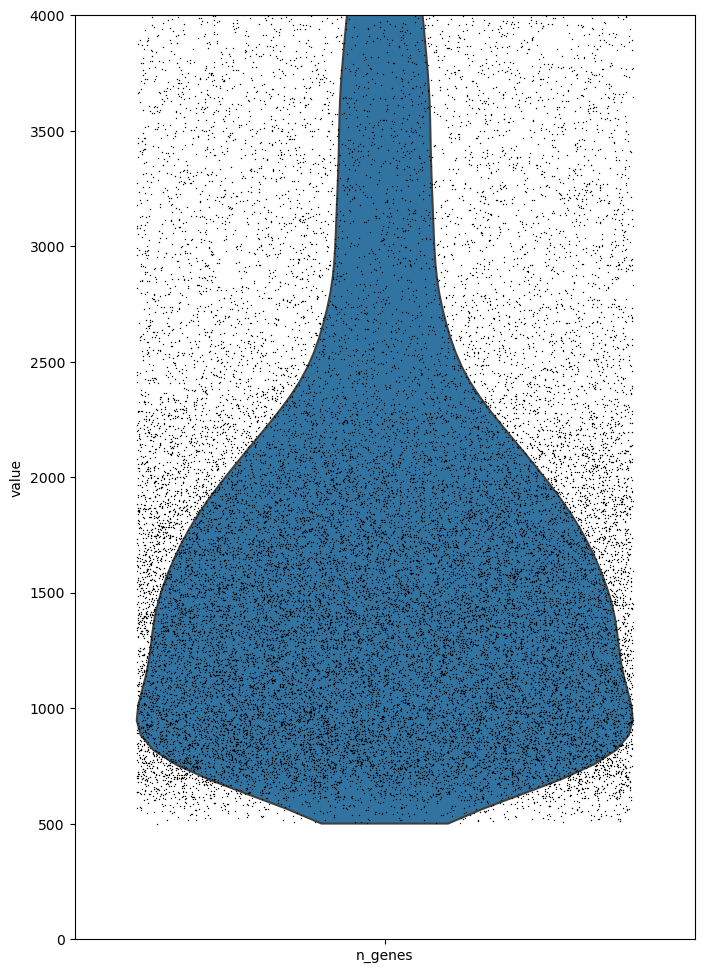

In [7]:
fig = plt.figure(figsize=(8,12))
ax1= fig.add_subplot()
ax1.set_ylim([0,4000])
sc.pl.violin(adata, ['n_genes'], jitter=0.4,ax=ax1)

In [73]:
mito = adata.obs['mt_fraction'] < 0.2
adata = adata[mito]

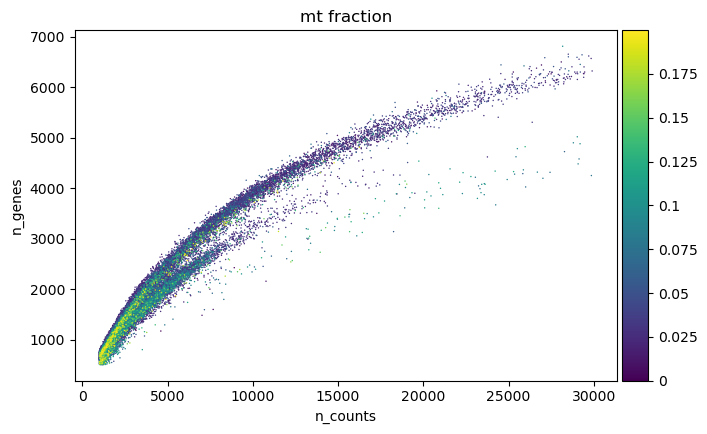

In [9]:
sc.pl.scatter(adata, x = 'n_counts', y='n_genes', color='mt_fraction')

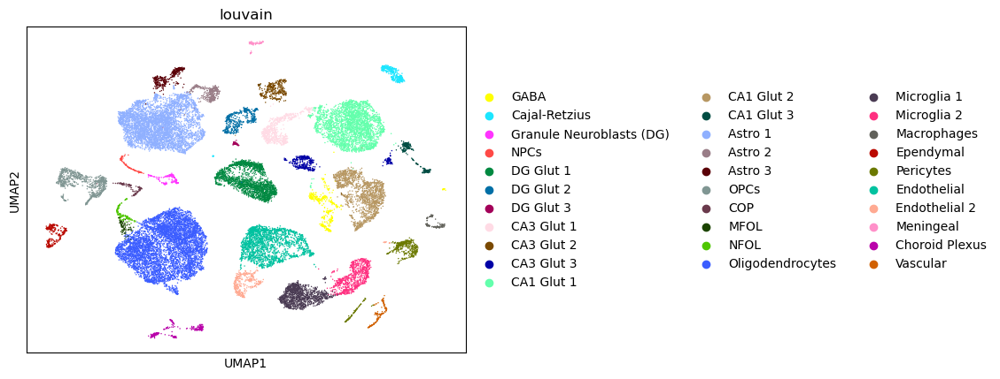

In [10]:
sc.pl.umap(adata, color='louvain')

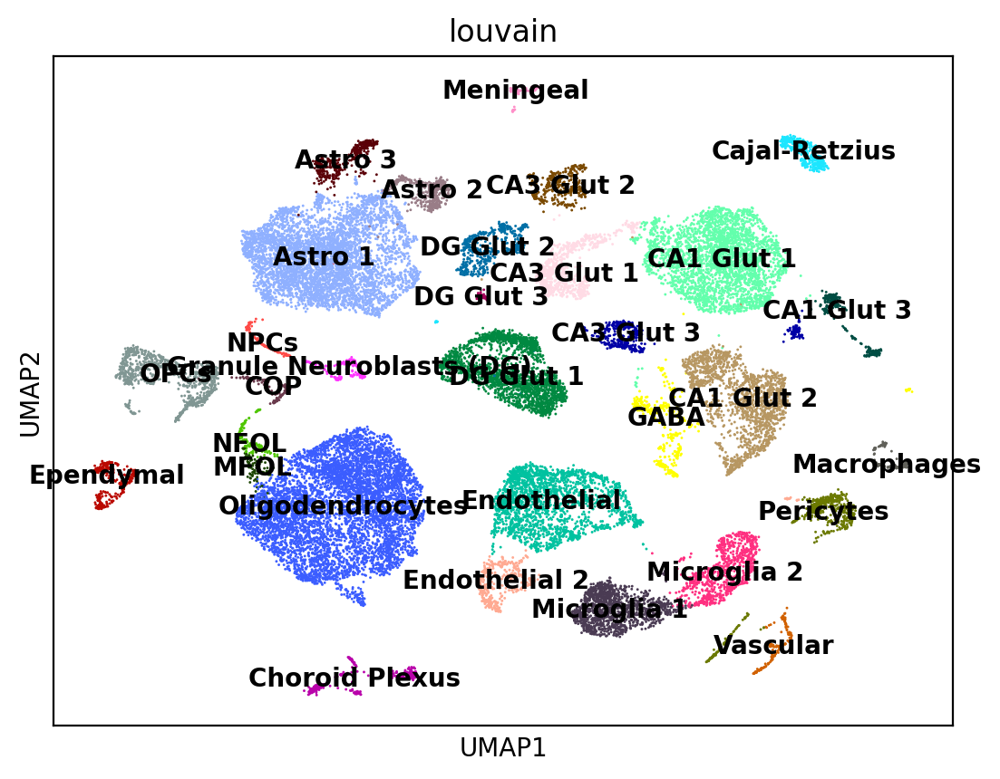

In [71]:
sc.pl.umap(adata, color='louvain', legend_loc='on data')
#https://scanpy.readthedocs.io/en/stable/generated/scanpy.pl.umap.html - resource used for on data function

## Claim 2 Comparison ##

### Stacked Violin from Paper ###
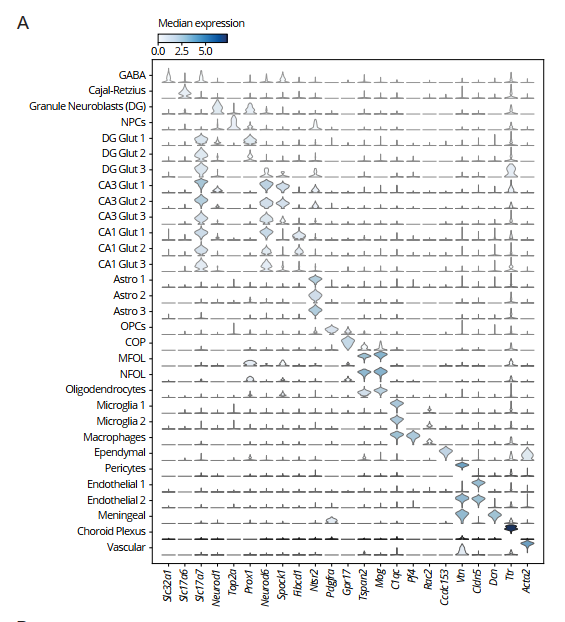

### Stacked Violin Reproduction ###
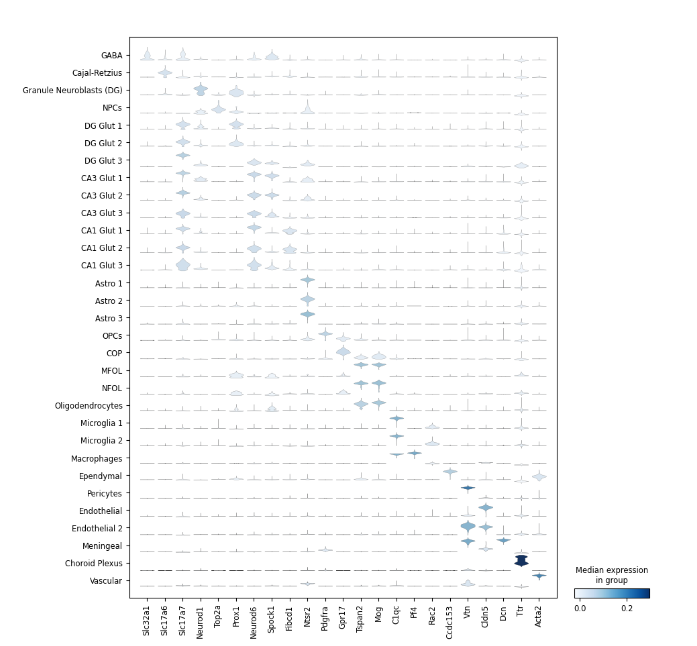

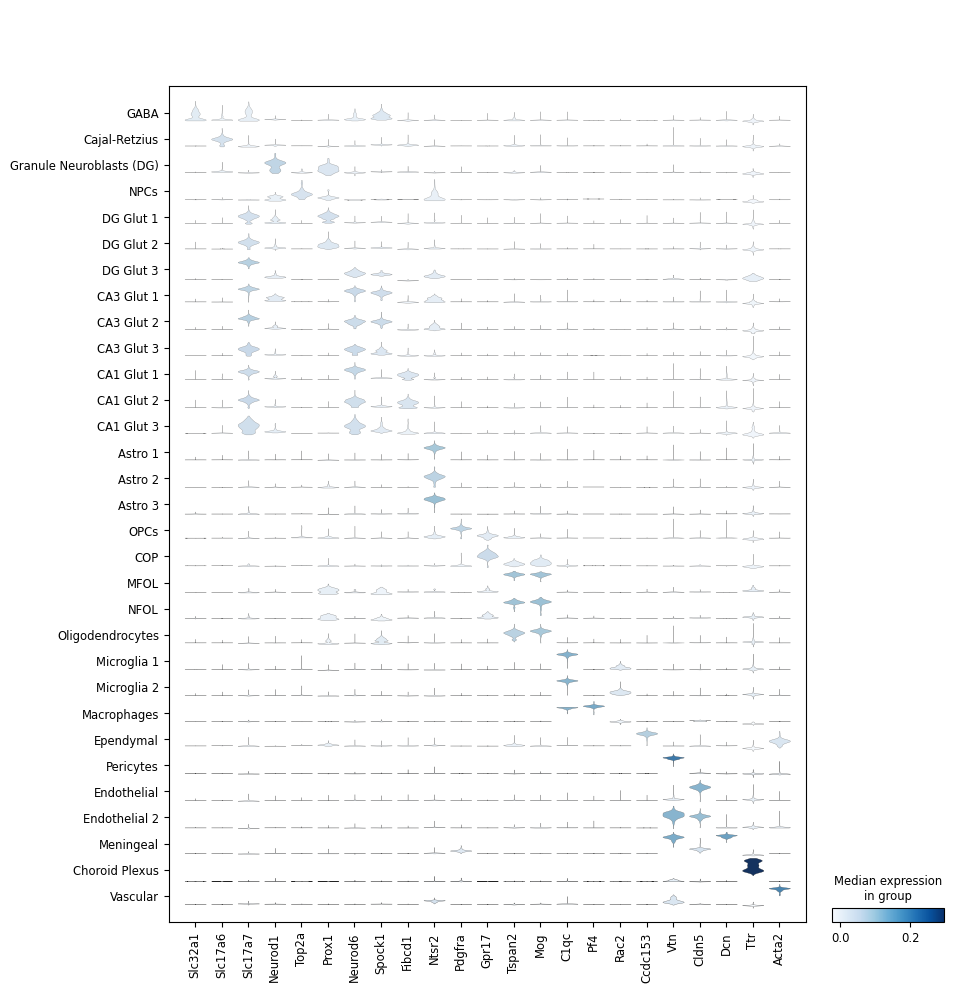

In [11]:
stackedviolin = sc.pl.stacked_violin(adata, groupby='louvain', var_names=['Slc32a1','Slc17a6','Slc17a7','Neurod1','Top2a','Prox1','Neurod6','Spock1','Fibcd1','Ntsr2','Pdgfra','Gpr17','Tspan2','Mog','C1qc','Pf4','Rac2','Ccdc153','Vtn','Cldn5','Dcn','Ttr','Acta2'])

#I used this reference for the stacked violin plot. https://samuel-marsh.github.io/scCustomize/reference/Stacked_VlnPlot.html. Also, for variable names, I took it from the supplemental figure to ensure that I was analyzing the same ones as the paper.

## Claim 3 Comparison ##

### Violin from Paper ###
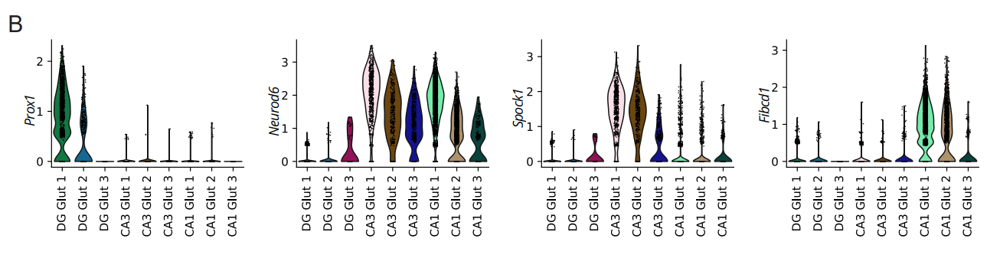

### Violin Reproductions ###
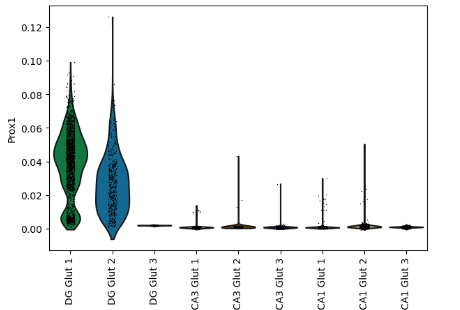
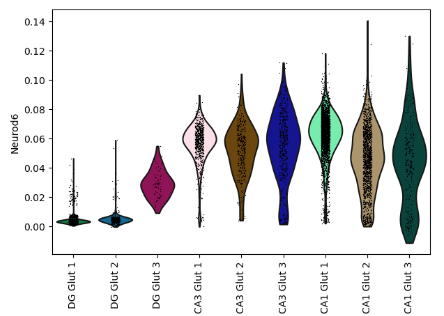
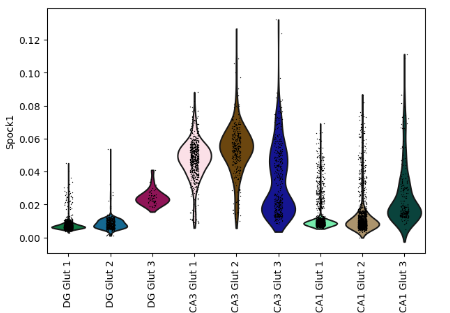
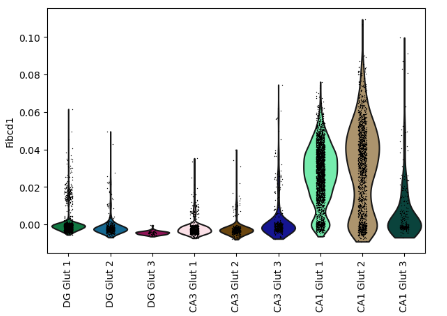

### UMAP from Paper ###
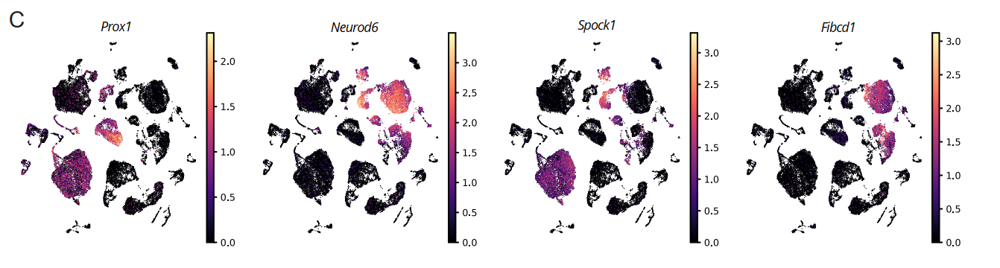

### UMAP Reproductions ###
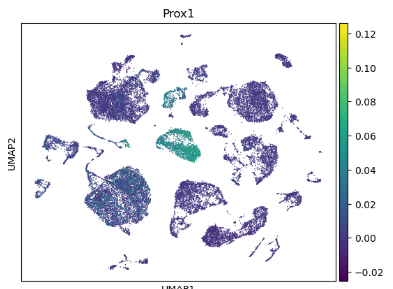
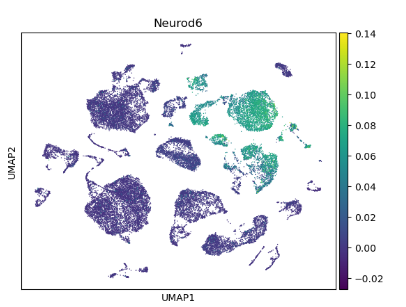
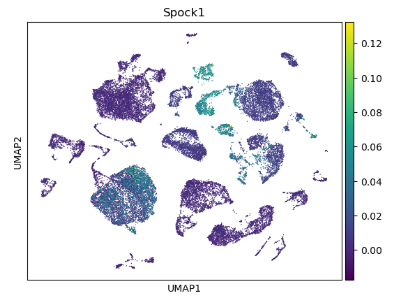
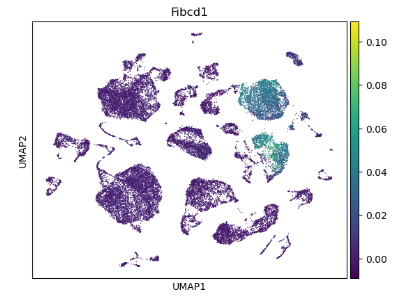


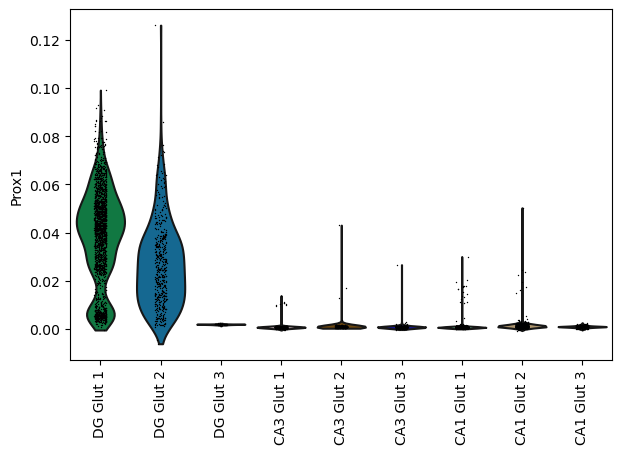

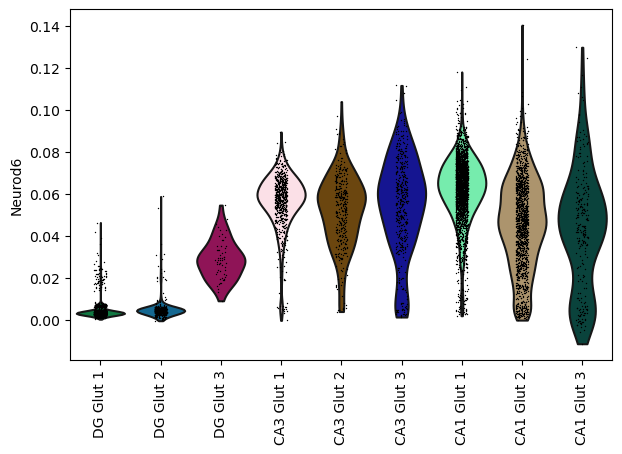

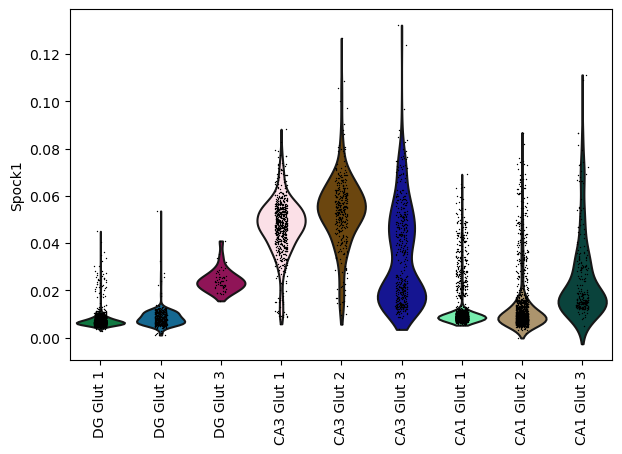

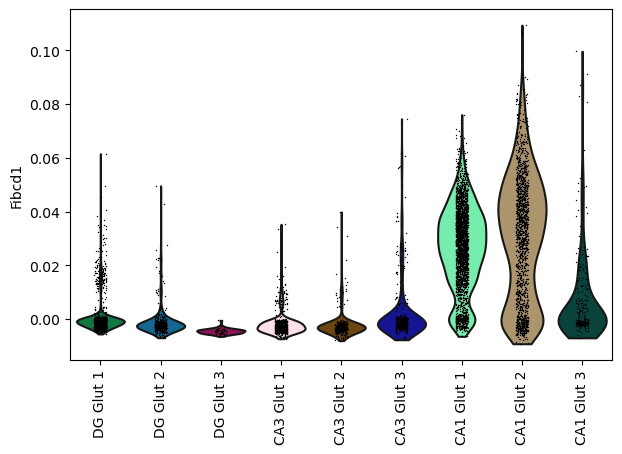

In [12]:
selectedclusters = ['DG Glut 1','DG Glut 2','DG Glut 3','CA3 Glut 1','CA3 Glut 2','CA3 Glut 3','CA1 Glut 1','CA1 Glut 2','CA1 Glut 3']
adataselected = adata[adata.obs['louvain'].isin(selectedclusters)]

sc.pl.violin(adataselected,keys='Prox1',groupby='louvain',rotation=90)
sc.pl.violin(adataselected,keys='Neurod6',groupby='louvain',rotation=90)
sc.pl.violin(adataselected,keys='Spock1',groupby='louvain',rotation=90)
sc.pl.violin(adataselected,keys='Fibcd1',groupby='louvain',rotation=90)

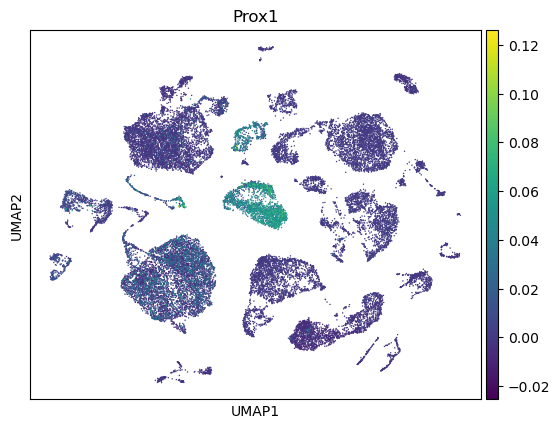

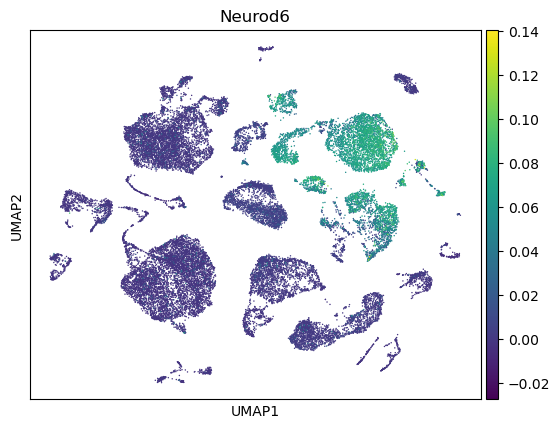

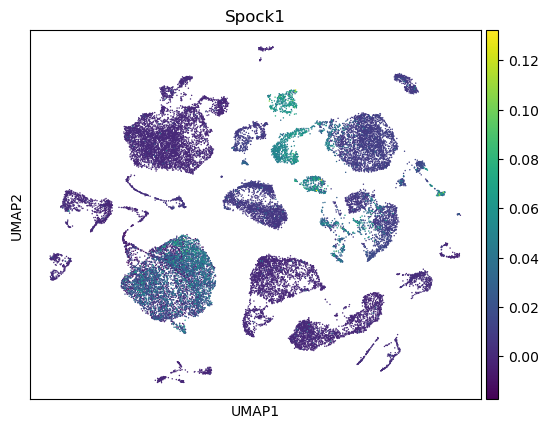

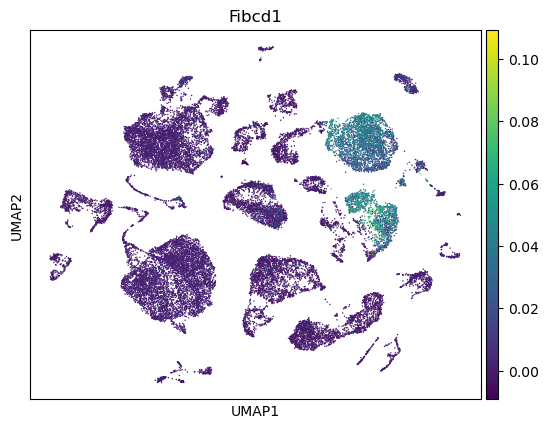

In [13]:
sc.pl.umap(adata, color='Prox1')
sc.pl.umap(adata, color='Neurod6')
sc.pl.umap(adata, color='Spock1')
sc.pl.umap(adata, color='Fibcd1')

## Claim 4 Comparison ##

### From Paper (Violin) ###
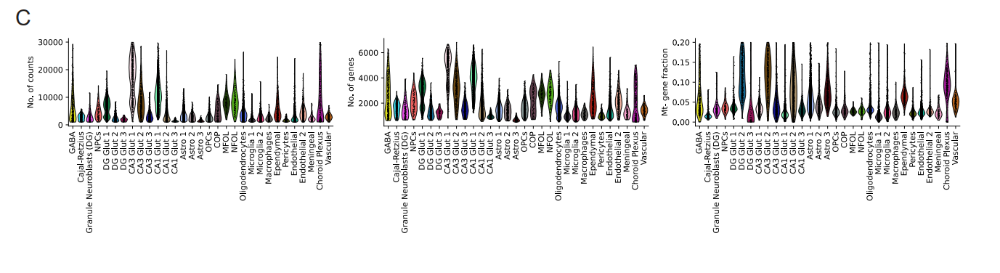

### Violin Reproductions ###
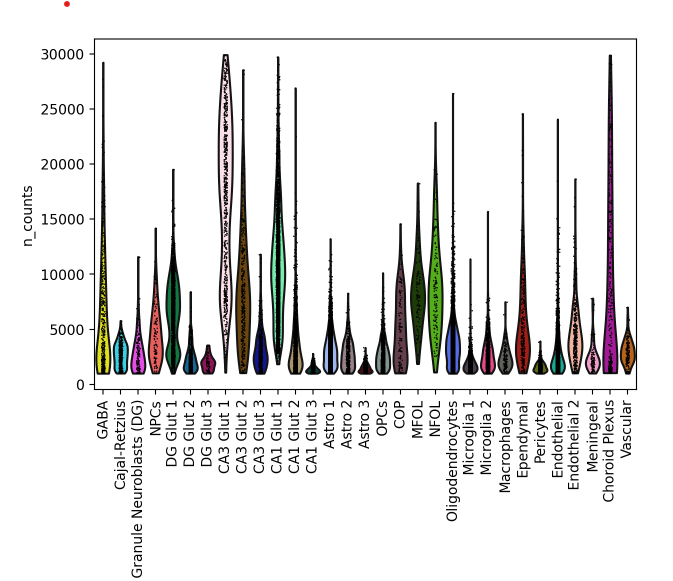
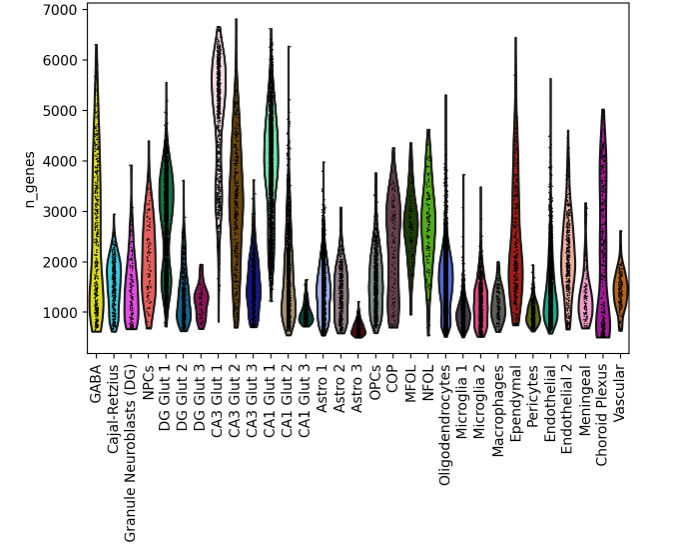
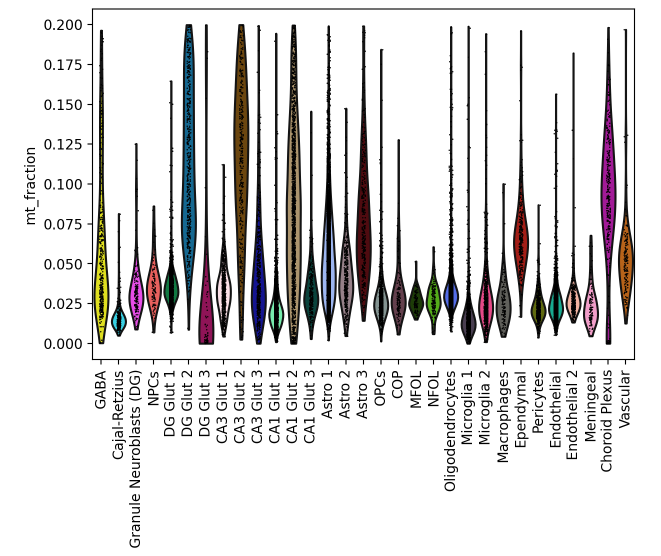

### From Paper (UMAP) ###
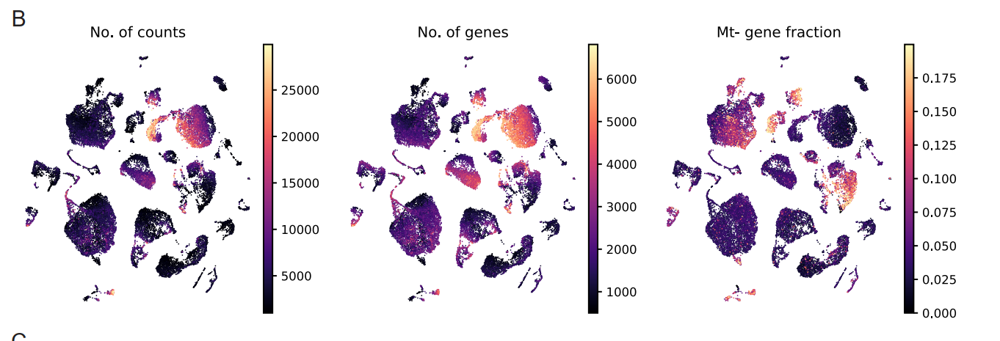

### UMAP Reproductions ###
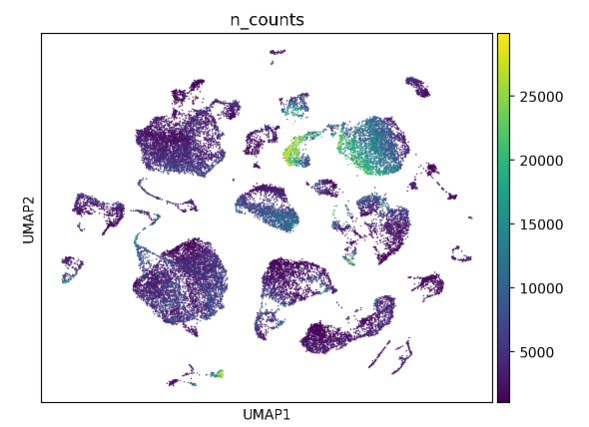
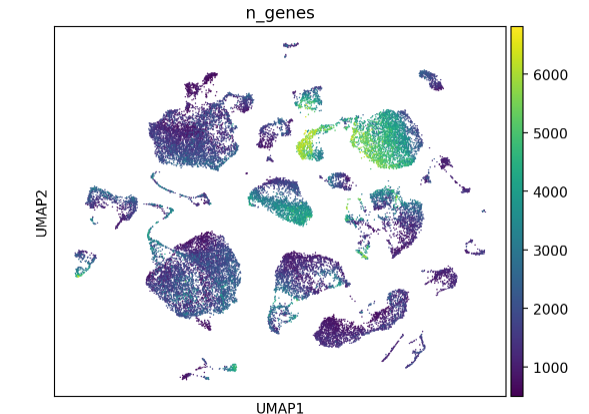
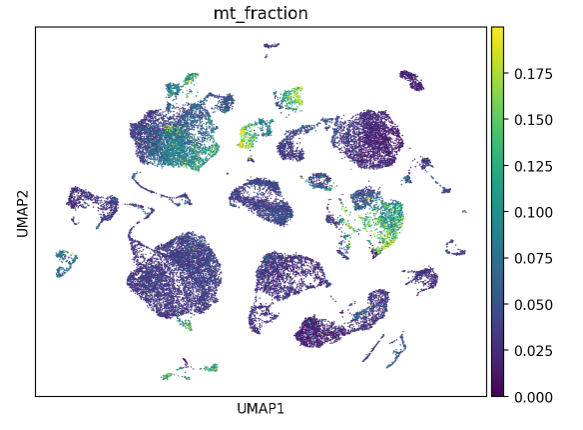


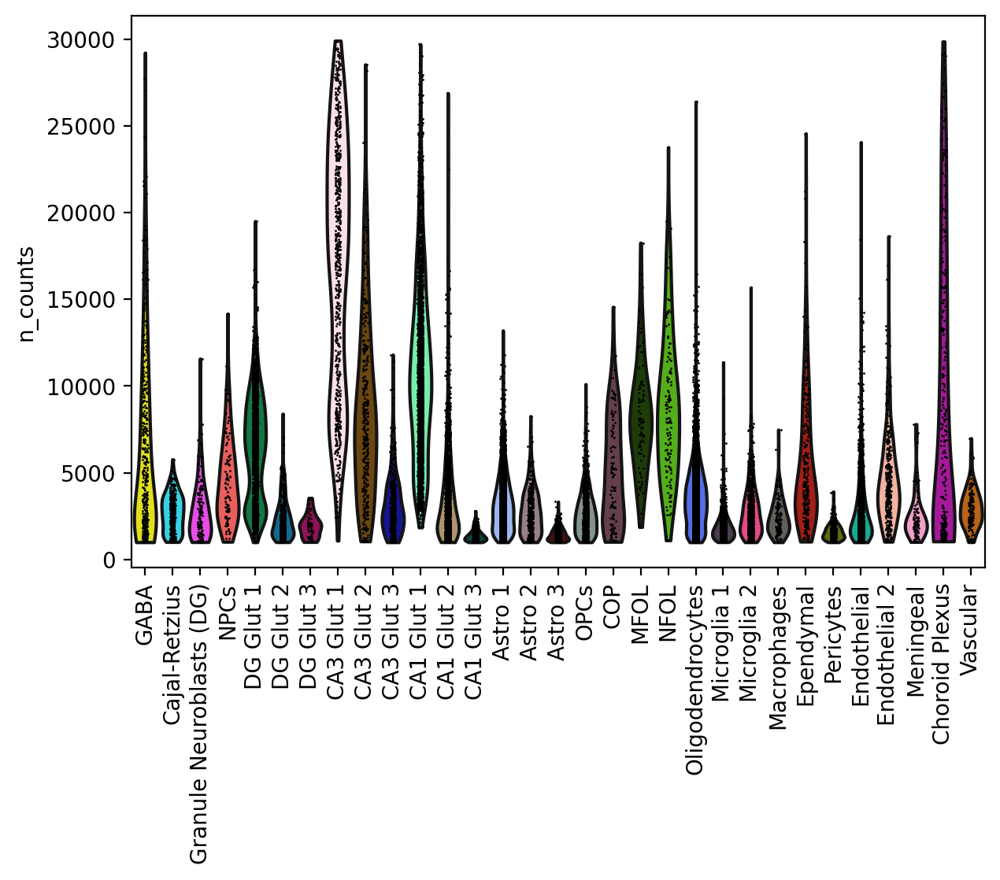

In [51]:
sc.pl.violin(adata,groupby='louvain',keys='n_counts',rotation=90,figsize=(24, 6))
plt.show()

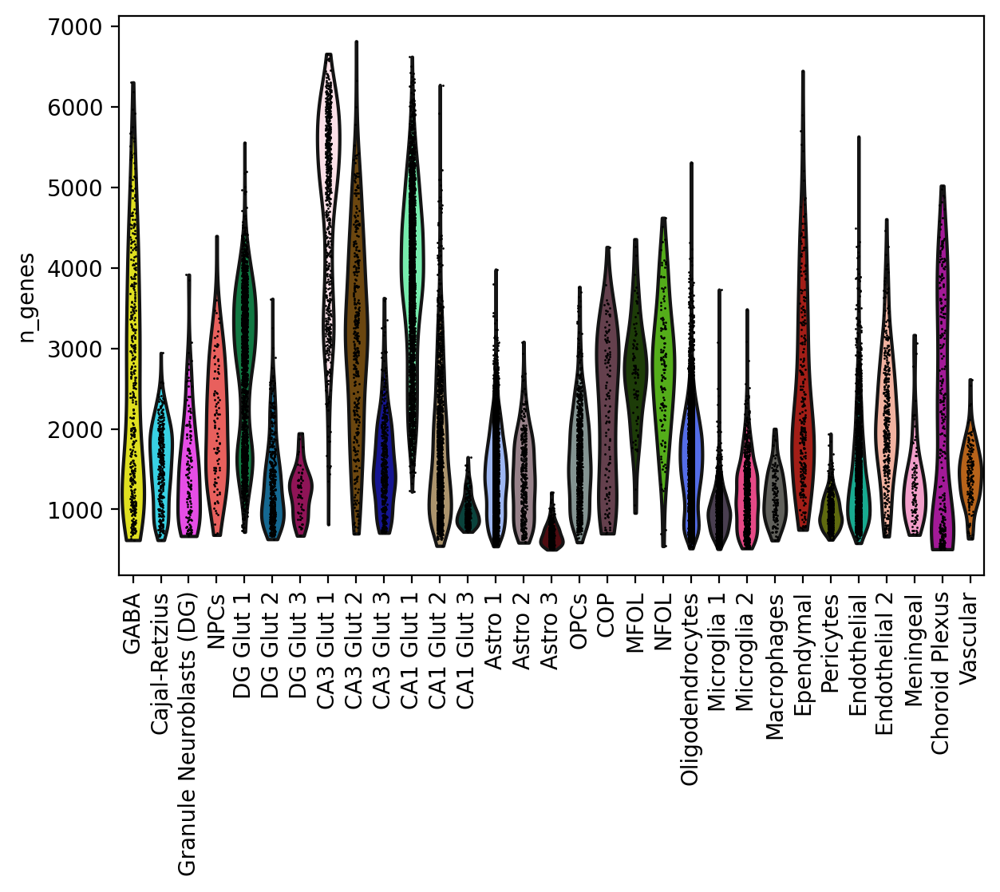

In [52]:
sc.pl.violin(adata,groupby='louvain',keys='n_genes',rotation=90,figsize=(24, 6))
plt.show()

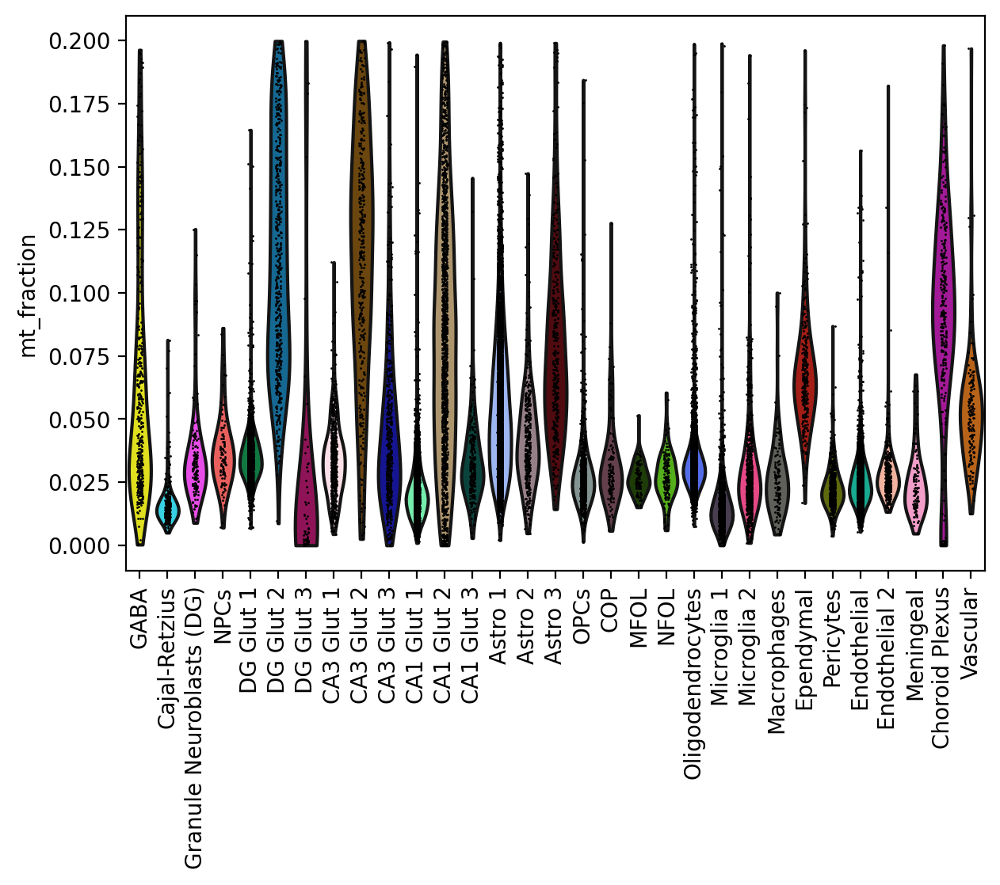

In [53]:
sc.pl.violin(adata,groupby='louvain',keys='mt_fraction',rotation=90,figsize=(24, 6))
plt.show()

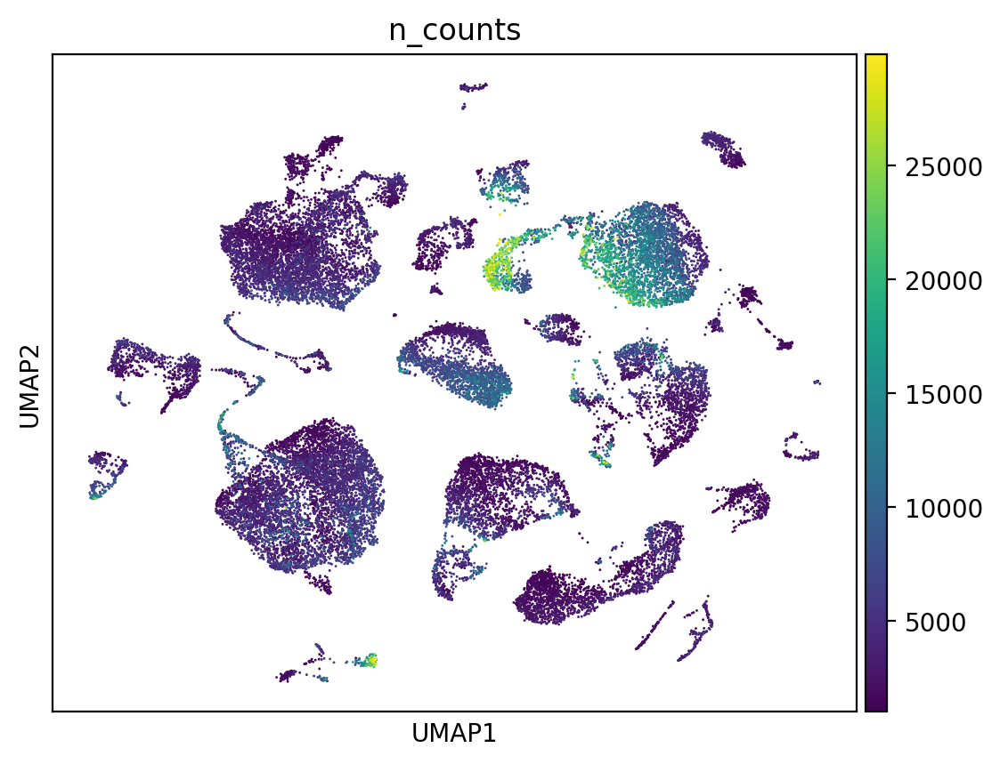

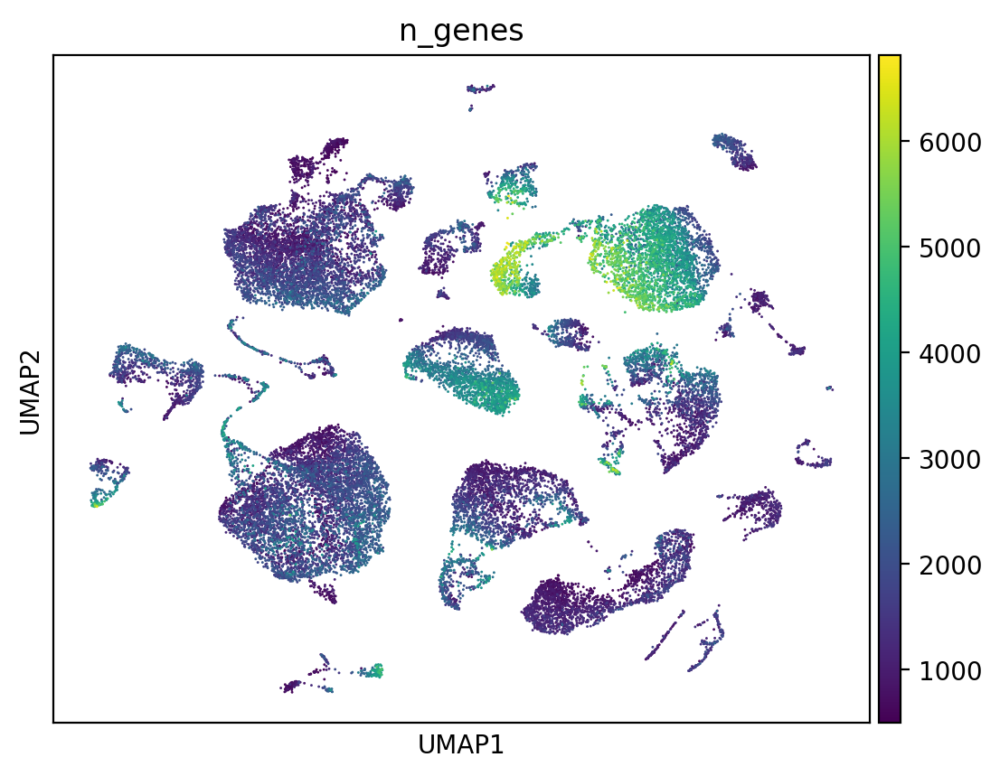

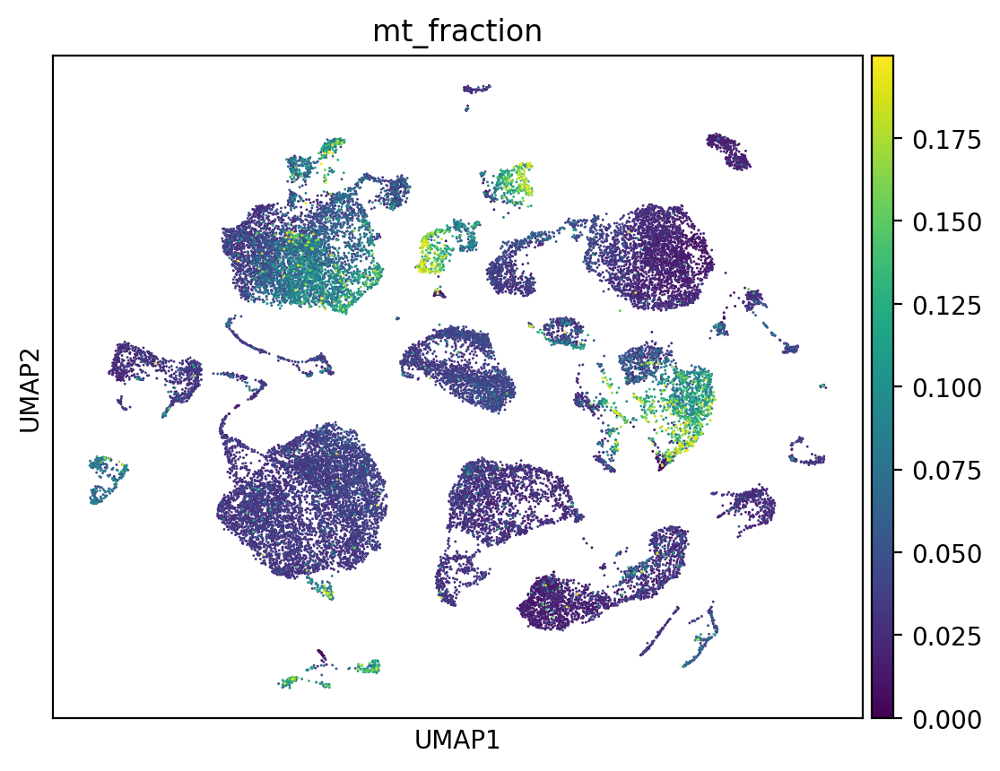

In [55]:
sc.pl.umap(adata,color='n_counts')
sc.pl.umap(adata,color='n_genes')
sc.pl.umap(adata,color='mt_fraction')

## Claim 5 Comparison ##

### From Paper ###
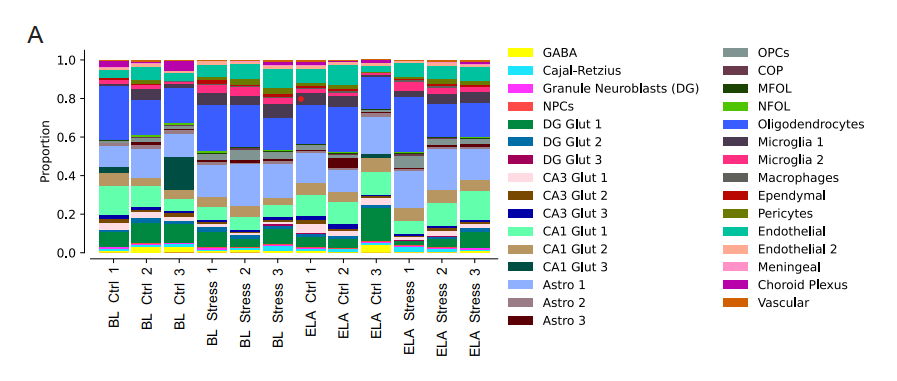

### Reproductions ###
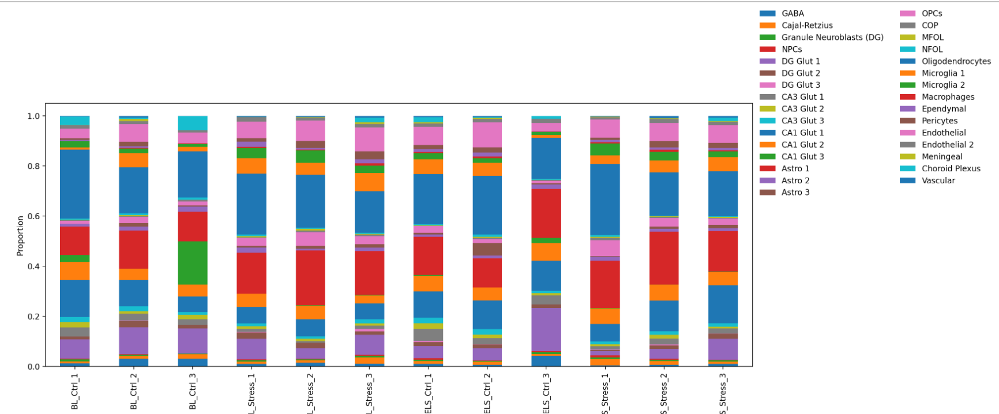

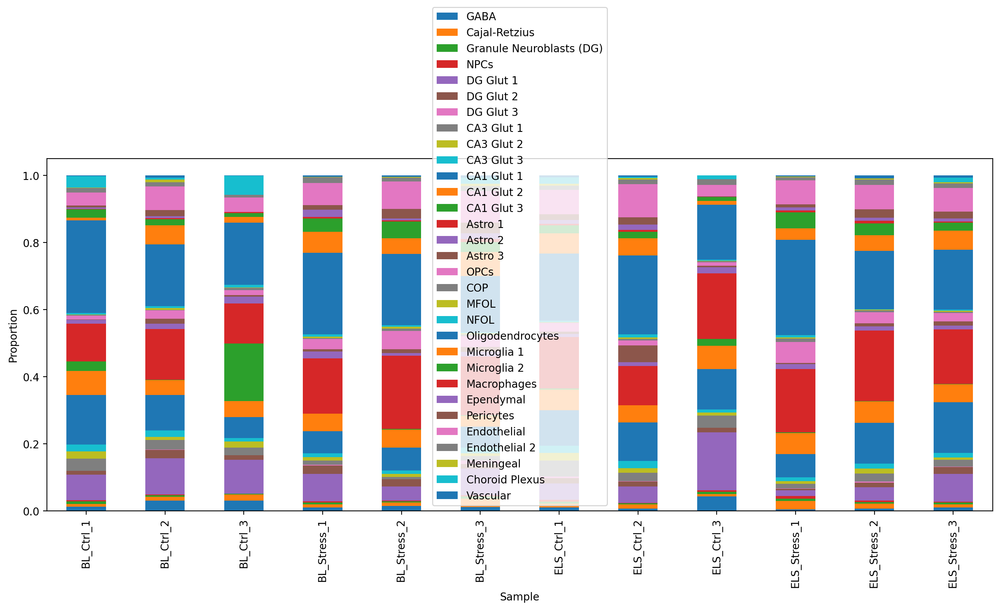

In [68]:
groupeddata = adata.obs[['sample_name','louvain']].groupby('sample_name')['louvain']
valuecounts = groupeddata.value_counts()
unstackeddata = valuecounts.unstack('louvain')

df = unstackeddata.div(unstackeddata.sum(axis=1),axis=0)

fig, ax = plt.subplots(1, 1, figsize=(16, 6))
df.plot(kind='bar', stacked=True, ax=ax).legend()

ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_xlabel('Sample')
ax.set_ylabel('Proportion')

plt.show()

#https://saturncloud.io/blog/rotate-tick-labels-in-subplot-using-pyplot-matplotlib-and-gridspec/ - source used for rotating labels

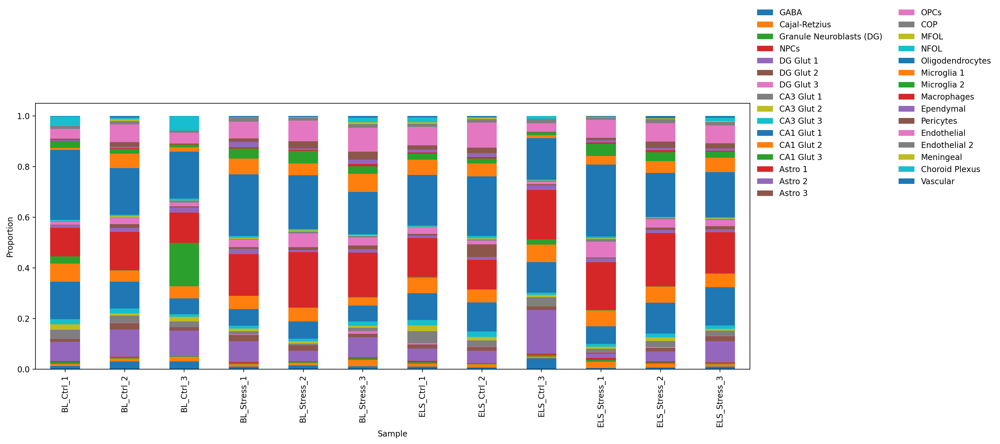

In [70]:
groupeddata = adata.obs[['sample_name','louvain']].groupby('sample_name')['louvain']
valuecounts = groupeddata.value_counts()
unstackeddata = valuecounts.unstack('louvain')

df = unstackeddata.div(unstackeddata.sum(axis=1),axis=0)

fig, ax = plt.subplots(1, 1, figsize=(16, 6))
df.plot(kind='bar', stacked=True, ax=ax).legend()

legend = ax.legend(loc='center left', bbox_to_anchor=(1.0, 1.0), frameon=False, ncol=2)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_xlabel('Sample')
ax.set_ylabel('Proportion')

plt.show()

#https://pieriantraining.com/matplotlib-tutorial-how-to-move-the-matplotlib-legend/ - source used for moving legend out of the way

## Discussion

Discussion: Do you find the main claims of the paper to be substantiated? Are there any areas where you could not reproducible the results or any caveats to what was found? Try to place the findings in the context of the field: how do they move the field forward. What are next steps for this research?

I was able to replicate the figures of the claims described in the introduction based on the data provided. Thus, in general, I would find these substantiated. After scRNA sequence analysis, the paper does a differential expression analysis using a generalized linear model. I did not reproduce the claims made in these analyses, as the authors did not make available the raw data sets used when conducting the modeling for the pattern scores. However, I still read the methods, results, and discussion for this gene expression analysis.

Ultimately, the authors were able to find that ELA exposure can result in changes to specific cell types, which can result in different responses to social stressors that may occur in adulthood. Through analyzing scRNA data, they localized and matched clusters of activity to parts of the brain. These findings are critical for the field, because it can allow for investigations of early therapeutic options. Specifically, by showing the vHPC as a critical site for activity, they have narrowed down a target for potential treatment options. The study briefly goes into how diazepam-treated ELA animals showed more social dominance than non-treated animals, hinting at further exploration in this area. The next steps of this research could be to look into the specific pathways that result in these changes (such as any signal transduction pathways), which may provide more of a focus for actionable development of therapeutics.

## Methods

Methods: Briefly explain any necessary details regarding the data and analysis. Where can the data be obtained and what packages are necessary to analyze. Include anything that someone would need to know to understand your notebook and reproduce its results.

Necessary packages to run the script include Numpy, Pandas, Scanpy, Anndata, and Matplotlib. Data can be obtained through downloading the dataset from https://figshare.com/articles/dataset/adata_els_h5ad/24420802/1. Descriptions of preprocessing steps were found in Methods section of paper.

Reference:
Kos, A., Lopez, J.P., Bordes, J., Donno, C., Dine, J., Brivio, E., Karamihalev, S., Luecken, M.D., Almeida-Correa, S., Gasperoni, S., Dick, A., Miranda, L., Buttner, M., Stoffel, R., Flachskamm, C., Theis, F., Schmidt, M., & Chen, A. (2023). Early life adversity shapes social subordination and cell type–specific transcriptomic patterning in the ventral hippocampus. *Science Advances, 9*(48). DOI: 10.1126/sciadv.adj3793


